In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
df = pd.read_parquet('fhvhv_tripdata_2021-01.parquet', engine='pyarrow')

In [3]:
df.head(5)

,hvfhs_license_num,dispatching_base_num,originating_base_num,request_datetime,on_scene_datetime,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,trip_miles,...,sales_tax,congestion_surcharge,airport_fee,tips,driver_pay,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,HV0003,B02682,B02682,2021-01-01 00:28:09,2021-01-01 00:31:42,2021-01-01 00:33:44,2021-01-01 00:49:07,230,166,5.26,...,1.98,2.75,NaN,0.00,14.99,N,N,,N,N
1,HV0003,B02682,B02682,2021-01-01 00:45:56,2021-01-01 00:55:19,2021-01-01 00:55:19,2021-01-01 01:18:21,152,167,3.65,...,1.63,0.00,NaN,0.00,17.06,N,N,,N,N
2,HV0003,B02764,B02764,2021-01-01 00:21:15,2021-01-01 00:22:41,2021-01-01 00:23:56,2021-01-01 00:38:05,233,142,3.51,...,1.25,2.75,NaN,0.94,12.98,N,N,,N,N
3,HV0003,B02764,B02764,2021-01-01 00:39:12,2021-01-01 00:42:37,2021-01-01 00:42:51,2021-01-01 00:45:50,142,143,0.74,...,0.70,2.75,NaN,0.00,7.41,N,N,,N,N
4,HV0003,B02764,B02764,2021-01-01 00:46:11,2021-01-01 00:47:17,2021-01-01 00:48:14,2021-01-01 01:08:42,143,78,9.20,...,2.41,2.75,NaN,0.00,22.44,N,N,,N,N


In [4]:
df = df.drop(['hvfhs_license_num',"dispatching_base_num","originating_base_num",'airport_fee',"on_scene_datetime","pickup_datetime","dropoff_datetime","base_passenger_fare","tolls","bcf","sales_tax","congestion_surcharge","tips","driver_pay"], axis=1)

In [5]:
df.head(20)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,2021-01-01 00:28:09,230,166,5.260,923,N,N,,N,N
1,2021-01-01 00:45:56,152,167,3.650,1382,N,N,,N,N
2,2021-01-01 00:21:15,233,142,3.510,849,N,N,,N,N
3,2021-01-01 00:39:12,142,143,0.740,179,N,N,,N,N
4,2021-01-01 00:46:11,143,78,9.200,1228,N,N,,N,N
5,2021-01-01 00:04:00,88,42,9.725,2162,N,N,N,N,N
6,2021-01-01 00:40:06,42,151,2.469,897,N,N,N,N,N
7,2021-01-01 00:10:36,71,226,13.530,2157,N,N,,N,N
8,2021-01-01 00:21:17,112,255,1.600,446,N,N,,N,N
9,2021-01-01 00:36:57,255,232,3.200,800,N,N,,N,N


In [6]:
df['request_datetime']= pd.to_datetime(df['request_datetime'])

In [7]:
df.head(5)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
0,2021-01-01 00:28:09,230,166,5.26,923,N,N,,N,N
1,2021-01-01 00:45:56,152,167,3.65,1382,N,N,,N,N
2,2021-01-01 00:21:15,233,142,3.51,849,N,N,,N,N
3,2021-01-01 00:39:12,142,143,0.74,179,N,N,,N,N
4,2021-01-01 00:46:11,143,78,9.20,1228,N,N,,N,N


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11908468 entries, 0 to 11908467
Data columns (total 10 columns):
 #   Column               Dtype         
---  ------               -----         
 0   request_datetime     datetime64[ns]
 1   PULocationID         int64         
 2   DOLocationID         int64         
 3   trip_miles           float64       
 4   trip_time            int64         
 5   shared_request_flag  object        
 6   shared_match_flag    object        
 7   access_a_ride_flag   object        
 8   wav_request_flag     object        
 9   wav_match_flag       object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 908.5+ MB


In [9]:
df = df.sample(frac=0.25, random_state=42)
df.head(5)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,2021-01-12 13:20:00,181,257,2.340,690,N,N,,N,N
328436,2021-01-01 19:12:57,132,229,16.700,1753,N,N,,N,N
11703194,2021-01-31 14:15:46,68,231,2.070,568,N,N,,N,N
3038135,2021-01-09 15:36:38,233,164,1.060,461,N,N,,N,N
2284945,2021-01-07 16:24:13,216,197,2.051,643,N,N,N,N,N


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2977117 entries, 4117959 to 11723519
Data columns (total 10 columns):
 #   Column               Dtype         
---  ------               -----         
 0   request_datetime     datetime64[ns]
 1   PULocationID         int64         
 2   DOLocationID         int64         
 3   trip_miles           float64       
 4   trip_time            int64         
 5   shared_request_flag  object        
 6   shared_match_flag    object        
 7   access_a_ride_flag   object        
 8   wav_request_flag     object        
 9   wav_match_flag       object        
dtypes: datetime64[ns](1), float64(1), int64(3), object(5)
memory usage: 249.8+ MB


In [11]:
df['request_datetime'] = df['request_datetime'].view('int64') // 10**9

In [12]:
df.head(4)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,1610457600,181,257,2.34,690,N,N,,N,N
328436,1609528377,132,229,16.70,1753,N,N,,N,N
11703194,1612102546,68,231,2.07,568,N,N,,N,N
3038135,1610206598,233,164,1.06,461,N,N,,N,N


In [13]:
#unique_values = df['request_datetime'].unique()

# Print the unique values
#for value in unique_values:
  #  print(value)

1610457600
1609528377
1612102546
1610206598
1610036653
1611602428
1610390974
1609505613
1611002340
1612027679
1611301598
1610096597
1611866381
1609526204
1611247165
1610494615
1609959453
1611930111
1611434830
1609781463
1610449871
1609688972
1610529790
1610173195
1611581377
1611327317
1611657382
1610974298
1609683085
1611406843
1610538976
1612030298
1611411782
1610411208
1611487781
1612113789
1610761744
1609735377
1610903177
1610149911
1611069715
1609998569
1610582497
1610629352
1609686517
1610647658
1610234089
1609888687
1612049972
1610155674
1610551467
1611774416
1610643221
1610191774
1609782788
1611009944
1610198382
1611523341
1611681187
1610216206
1611140398
1610342314
1610208463
1610048839
1609592233
1609536330
1611446127
1610783465
1609935169
1609471391
1610001321
1610791918
1609466742
1609693694
1611488084
1611088286
1610391806
1611664507
1610683919
1612102658
1612048727
1611826946
1610812214
1609834934
1611640751
1611773792
1609598788
1611426407
1611471752
1611876988
1611296182

1611735832
1611493688
1611579425
1610822774
1611413476
1611702504
1611329586
1612051083
1610628985
1611007262
1611170129
1611170299
1610819042
1609779082
1611772650
1610070762
1611088719
1610488432
1610713841
1610705125
1610108187
1611632492
1610787524
1612021886
1610413142
1611132015
1610358927
1611768687
1610440450
1609646131
1611250788
1610062239
1611859873
1610131186
1610367186
1611216553
1611555230
1610554418
1611699960
1611315000
1610806666
1610998270
1609519579
1609941132
1611342474
1610114513
1610025631
1610092083
1612045169
1611154338
1611527700
1611824371
1611163338
1609703963
1612107371
1611009821
1609463049
1610742781
1611757519
1610820552
1610653654
1611603161
1610652108
1611085731
1609808735
1611695564
1610044206
1611405715
1611967502
1609754818
1609869894
1610390251
1611877457
1611406358
1611214539
1610122202
1611831337
1611235573
1611334187
1611345454
1610478699
1611151119
1609717925
1611668361
1610488595
1611484169
1610956900
1609594540
1610841115
1610003141
1611868604

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



1610309690
1611871345
1609857367
1612088635
1610810960
1609522521
1609769019
1610358391
1609641027
1611480882
1610929526
1611145921
1610773217
1610753862
1609522778
1610743304
1609688288
1611239454
1610451607
1609719027
1611673150
1611063560
1609540590
1611302472
1610287316
1610442605
1611385739
1609919119
1610580698
1609584745
1609696422
1611070445
1611013879
1610302875
1611953765
1609541005
1609735025
1612096173
1611369336
1610816281
1610880029
1609576544
1611003157
1611875346
1610137967
1611207875
1611475620
1610577074
1611256209
1610124566
1610193632
1611443396
1610836873
1611515103
1611455617
1610652454
1611094282
1611290136
1610719175
1610961775
1610369164
1612025293
1610577164
1610531383
1611581655
1610721729
1609929393
1610405053
1612117178
1611817540
1611779739
1611653683
1611510230
1612018958
1611302955
1611270095
1612099133
1611517353
1610548420
1609782456
1609632032
1609515587
1609894457
1610723191
1611241994
1611663304
1610084555
1611932046
1611743584
1610527446
1610757945

1612080497
1610205280
1611275636
1610816303
1611411251
1611009258
1610763496
1610403265
1610219700
1610489489
1611600687
1610428697
1609610111
1611037461
1610906274
1610624853
1610340229
1611516120
1609803615
1611700872
1612009461
1610781465
1610368218
1609527385
1611052472
1610812247
1612124015
1612070644
1611493272
1611613055
1609686404
1611482608
1609585339
1611147170
1610304147
1609639676
1610585399
1610119535
1611213241
1610557224
1610741139
1609846288
1609747024
1610164813
1610716066
1610535075
1610152248
1610220561
1611175986
1610485315
1611456079
1609470160
1610267915
1612051979
1610488744
1609969258
1610606451
1611299667
1610238345
1610720781
1610690881
1611002316
1610566649
1611485192
1609954236
1610294430
1612092140
1610568755
1610444790
1610344544
1610443032
1612065470
1610116995
1611931129
1611198241
1611822406
1611379393
1610162947
1611132422
1610744245
1612081655
1611468417
1610907633
1611833905
1611928871
1611253986
1609626779
1611532745
1610151416
1609917856
1611221626

1612104791
1610818427
1610262309
1609751229
1610103032
1610035966
1611610485
1611763361
1610494664
1610096520
1611215403
1611966225
1611022456
1611651110
1610909572
1609514537
1611680763
1610750041
1610319253
1612041083
1610119740
1611929023
1610895550
1611910010
1610352731
1611442766
1611060899
1611322546
1611937783
1610178617
1610883253
1610033144
1609585886
1611167773
1610665487
1611473311
1610282644
1609481964
1610614849
1611536661
1611593357
1609496083
1611649571
1609759412
1611165675
1610373600
1610817806
1610798330
1610346706
1610456716
1610635360
1610116049
1611402904
1610078867
1609693151
1609794387
1611795489
1611214411
1609716796
1610285943
1611074667
1610647768
1610230610
1610696455
1610028764
1609985538
1611499409
1610580191
1610543340
1611779786
1610566756
1610793811
1609940389
1610084577
1611728594
1610319904
1611534622
1610542946
1610309826
1609810652
1610366320
1612038497
1610959668
1611790768
1610106376
1610203378
1610144503
1611791145
1612010891
1610293034
1609643574

1609488214
1610989482
1610271321
1609855890
1611217780
1611729067
1611220113
1610528310
1611314459
1611522094
1609919412
1611788809
1611049820
1611241493
1611501907
1611313518
1610014017
1610621822
1610280834
1610847089
1610477173
1610987838
1609883698
1610475793
1610107270
1610981764
1610476979
1611675457
1610501672
1610641314
1611023905
1610357112
1610871678
1609949753
1610116909
1610917996
1611064523
1609867226
1611750129
1611447196
1610712996
1611771104
1611849844
1612088549
1611260375
1611642037
1610115710
1611118148
1610767102
1610447968
1610284498
1610931717
1611135458
1611230081
1610283758
1610353429
1609685535
1612074655
1611807566
1611742247
1610654266
1610560808
1611591198
1609928047
1610100107
1611424517
1610826601
1609932373
1609966353
1611825672
1611901669
1610489970
1611489376
1611309679
1610800321
1609699366
1610669773
1611167269
1609526507
1610401490
1610611975
1611580950
1610140900
1611062896
1610548360
1610004652
1610044539
1610135403
1612026693
1609854999
1612123038

1611959144
1611810130
1611348158
1610431325
1611460638
1609714297
1610282065
1610232770
1612035063
1611528576
1609572642
1611950790
1611436414
1610235023
1611417731
1609889260
1610069435
1609817838
1610404322
1611953032
1610909437
1609741610
1611362650
1609997848
1611176603
1611592360
1611875644
1610677794
1611180082
1609836403
1611614804
1611814019
1611958358
1610275416
1610671239
1611078810
1610439474
1610840871
1610710566
1610166216
1610932308
1611179251
1610730212
1610855716
1610344634
1611485598
1609698833
1609882042
1611782377
1612088440
1610947666
1610672580
1611500583
1610268917
1610399287
1610399544
1609896509
1609731272
1611422334
1611717652
1610882742
1611263079
1611483225
1611790872
1611395294
1610843964
1609894774
1611862198
1610784163
1610381955
1612066551
1610969496
1610194823
1611851678
1609487673
1611945908
1610194002
1611606935
1612060885
1612132912
1610965976
1611426284
1609727113
1611522172
1611701511
1609915551
1611014110
1611747954
1611566691
1611135979
1610858912

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [14]:
df['shared_request_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [15]:
df['shared_match_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [16]:
df['access_a_ride_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [17]:
df['wav_request_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [18]:
df['wav_match_flag'].replace(['N','Y'],[0,1],inplace=True)
print(df.iloc[:,1].values)

[181 132  68 ... 242 244 231]


In [19]:
df.head(10)

,request_datetime,PULocationID,DOLocationID,trip_miles,trip_time,shared_request_flag,shared_match_flag,access_a_ride_flag,wav_request_flag,wav_match_flag
4117959,1610457600,181,257,2.340,690,0,0,,0,0
328436,1609528377,132,229,16.700,1753,0,0,,0,0
11703194,1612102546,68,231,2.070,568,0,0,,0,0
3038135,1610206598,233,164,1.060,461,0,0,,0,0
2284945,1610036653,216,197,2.051,643,0,0,0,0,0
9302237,1611602428,130,216,1.220,325,0,0,,0,0
3870210,1610390974,7,226,1.960,474,0,0,,0,0
214513,1609505613,232,162,3.004,787,0,0,0,0,0
6577487,1611002340,79,87,3.260,623,0,0,,0,0
11333516,1612027679,213,126,1.920,644,0,0,,0,0


In [20]:
unique_values = df['shared_request_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [21]:
unique_values = df['shared_match_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [22]:
unique_values = df['wav_request_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [23]:
unique_values = df['wav_match_flag'].unique()

# Print the unique values
for value in unique_values:
    print(value)

0
1


In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2977117 entries, 4117959 to 11723519
Data columns (total 10 columns):
 #   Column               Dtype  
---  ------               -----  
 0   request_datetime     int64  
 1   PULocationID         int64  
 2   DOLocationID         int64  
 3   trip_miles           float64
 4   trip_time            int64  
 5   shared_request_flag  int64  
 6   shared_match_flag    int64  
 7   access_a_ride_flag   object 
 8   wav_request_flag     int64  
 9   wav_match_flag       int64  
dtypes: float64(1), int64(8), object(1)
memory usage: 249.8+ MB


In [25]:
# Check for missing values in the specified feature
missing_values = df['shared_request_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [26]:
# Check for missing values in the specified feature
missing_values = df['shared_match_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [27]:
# Check for missing values in the specified feature
missing_values = df['access_a_ride_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

In [28]:
# Check for missing values in the specified feature
missing_values = df['wav_request_flag'].isnull()

# Count the number of missing values in the feature
num_missing_values = missing_values.sum()
num_missing_values

0

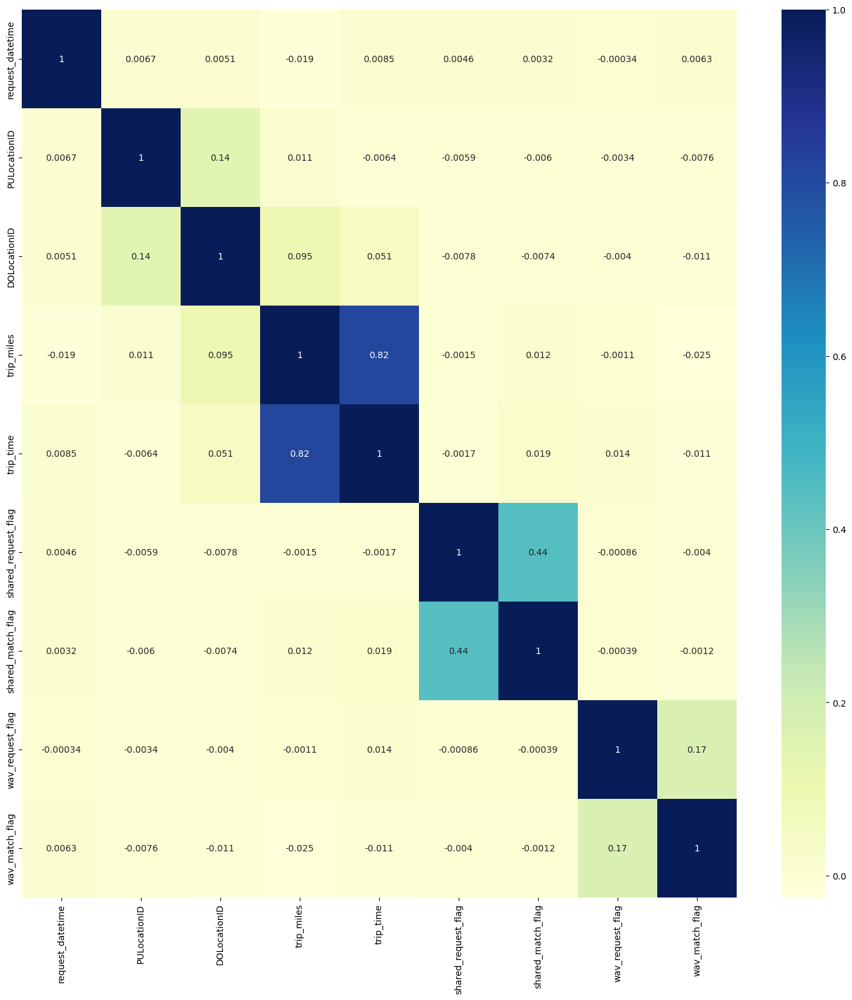

Index(['request_datetime', 'PULocationID', 'DOLocationID', 'trip_miles',
       'trip_time', 'shared_request_flag', 'shared_match_flag',
       'access_a_ride_flag', 'wav_request_flag', 'wav_match_flag'],
      dtype='object')

In [29]:
plt.subplots(figsize=(18,18))
dataplot= sb.heatmap(df.corr(), cmap="YlGnBu",annot=True) 
plt.show()
df.columns

Top  features for target 1: ['wav_match_flag', 'wav_request_flag', 'trip_miles', 'trip_time', 'DOLocationID']


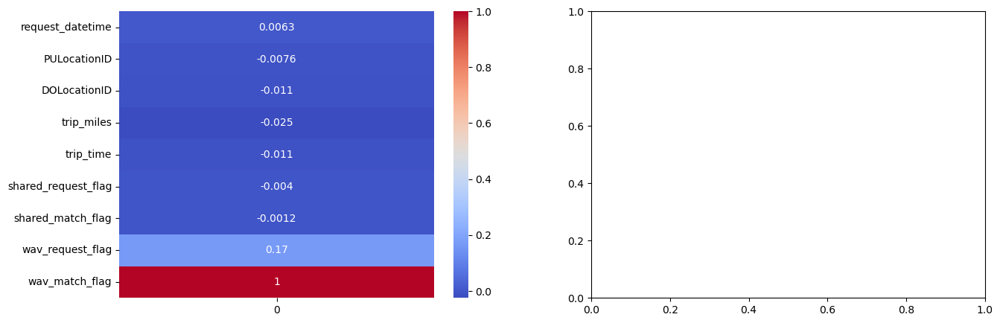

In [30]:
corr_matrix_target1 = df.corrwith(df['wav_match_flag'])

# Plot the heatmaps
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(15,5))
sb.heatmap(corr_matrix_target1.to_frame(), annot=True, cmap='coolwarm', ax=ax[0])

# Find the features with the highest correlation for each target
top_n_features_target1 = corr_matrix_target1.abs().sort_values(ascending=False).head().index.tolist()

# Print the top features
print(f"Top  features for target 1: {top_n_features_target1}")

In [31]:
X = df[['PULocationID','DOLocationID','trip_miles','trip_time','wav_request_flag','request_datetime',"shared_request_flag","shared_match_flag",]]
y = df['wav_match_flag']

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,y,test_size=0.3,random_state=7)

In [33]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
# Initialize the logistic regression model
logreg = LogisticRegression()

# Train the model on the training data
logreg.fit(X_train, Y_train)

# Make predictions on the testing data
y_pred = logreg.predict(X_test)

# Evaluate the performance of the model
accuracy = accuracy_score(Y_test, y_pred)
print("Accuracy:", accuracy)
precision = precision_score(Y_test, y_pred)
print("Precision:", precision)

# Calculate recall score
recall = recall_score(Y_test, y_pred)
print("Recall:", recall)

# Calculate F1 score
f1 = f1_score(Y_test, y_pred)
print("F1 score:", f1)

# Calculate confusion matrix
conf_matrix = confusion_matrix(Y_test, y_pred)
print("Confusion matrix:\n", conf_matrix)

Accuracy: 0.9534012737141936
Precision: 0.9967974379503602
Recall: 0.02904806346243584
F1 score: 0.05645106440862409
Confusion matrix:
 [[850272      4]
 [ 41615   1245]]


In [35]:

from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Feature scaling (optional)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Train the logistic regression model
model = LogisticRegression()
model.fit(X_train_scaled, y_train)

# Step 5: Predict probability of cab sharing
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Probability of positive class (cab sharing)

# Step 6: Evaluate model performance
accuracy = accuracy_score(y_test, y_pred_proba.round())
precision = precision_score(y_test, y_pred_proba.round())
recall = recall_score(y_test, y_pred_proba.round())
roc_auc = roc_auc_score(y_test, y_pred_proba)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)

# Step 7: Fine-tune and validate the model as needed


Accuracy: 0.9532366851185038
Precision: 0.9989189189189189
Recall: 0.03212013765773282
ROC AUC: 0.5627948884791633


In [36]:
y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Probability of positive class (cab sharing)


In [37]:
y_pred_proba

array([0.04553896, 0.04940578, 0.04411424, ..., 0.04737313, 0.0485537 ,
       0.0501374 ])

In [38]:

# Assuming you have already obtained the predicted probabilities (y_pred_proba) and the test data (X_test_scaled)

# Create a DataFrame with test samples and predicted probabilities
results_df = pd.DataFrame(X_test, columns=['PULocationID', 'DOLocationID', 'trip_miles', 'trip_time', 'wav_request_flag', 'request_datetime'])
results_df['Predicted_Probability'] = y_pred_proba*1000

# Display the results table
results_df.head(10)


,PULocationID,DOLocationID,trip_miles,trip_time,wav_request_flag,request_datetime,Predicted_Probability
4191649,234,209,2.486,682,0,1610471445,45.538963
1138882,97,87,2.830,848,0,1609755818,49.405780
970127,69,248,3.310,634,0,1609698639,44.114236
4593205,130,131,0.630,150,0,1610563059,48.328399
6113269,152,234,7.189,1702,0,1610892689,44.743241
8616347,47,60,1.220,295,0,1611445167,52.058388
6088381,37,148,5.784,1872,0,1610891308,52.977850
3644066,39,155,5.050,685,0,1610347587,43.424057
5940818,112,28,9.240,959,0,1610841785,38.388798
10579172,232,213,13.320,1309,0,1611898805,30.890246


In [39]:
import os
import sys
import pickle

projectabspathname = os.path.abspath('sharing of cab.pickle')
print(projectabspathname)
projectname = 'sharing of cab.ipynb'
projectpickle = open(str(projectabspathname),'wb')
pickle.dump(projectname, projectpickle)
projectpickle.close()

C:\Users\HP\sharing of cab.pickle
